In [1]:
# default_exp codexplainer.prototypes_criticisms

In [1]:
# export

import numpy as np
import pandas as pd

from typing import Tuple, List, Optional, Any, Iterable, Dict
from abc import ABC, abstractmethod

from pathlib import Path
import pickle

# ds4se
import ds4se
from ds4se.utils.clusterization import *
from ds4se.utils.visualization import *
from ds4se.mgmnt.prep.files_mgmnt import *
from ds4se.utils.distances import *

from tqdm import tqdm

In [2]:
# export

import logging

logger = logging.getLogger(__name__)
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)
logger.setLevel(logging.INFO)

## prototypes_criticisms

> Protoypes and criticisms analysis based on [Section 6.3](https://christophm.github.io/interpretable-ml-book/proto.html) section of the [Interpretable Machine Learning book](https://christophm.github.io/interpretable-ml-book/)

## Utils

In [3]:
# export

def reshape_vectors(vectors):
    result = []
    for v in vectors:
        result.append(v.reshape(500,1).T)
    return np.array(result)

## Parameterization

In [4]:
params = {
    "vectors_path": "/tf/main/dvc-ds4se/results/d2v_vectors",
    "plots_path": "/tf/main/dvc-ds4se/results/plotting"
}

## Find Prototypes

The authors of the book use a method based on the  maximum mean discrepancy. However, they highlight the fact that any* clustering algorithm can be used.

\* The clustering algorithm used to find prototypes should return <i>real</i> data points as centroids.

In [5]:
# export


# General implementation aiming to allow the use of different clustering algorithms

class Clusterizer(ABC):
    def __init__(self):
        pass
    
    @abstractmethod
    def perform_clusterization(self, data_vectors: np.ndarray, dims: Optional[int]=2,
                               dist_metric: Optional[str]='euclidean'):
        """
        Perform clusterization on a given dataset
        
        """
        pass

In [6]:
# export

class KMedoidsClusterizer(Clusterizer):
    def __init__(self):
        # TODO
        super().__init__()
        
    def perform_clusterization(self, data_vectors: np, dims: Optional[int]=2,
                               dist_metric: Optional[str]='euclidean') -> Tuple:
        """
        Perform clusterization using k-medoids
        - First perform dimensionality reduction by means of PCA + t-SNE
        - Finds best k
        
        :param data_vectors:
        :param dims: Int. indicating the number of dimensions for
                     dim. reduction
                     
        :return: Tuple (reduced data, clusters, medoid ids, k_medoids_instance (pyclustering obj.))
        """
        return perform_clusterize_kmedoids(data_vectors, dims=dims, reduct_dist=dist_metric)
        

In [6]:
# TODO: Integrate gravitational clustering

In [7]:
trn_vectors = load_np_vectors(f"{params['vectors_path']}/doc2_vec_sample_java_df.npy")

In [8]:
tst_vectors = load_np_vectors(f"{params['vectors_path']}/doc2_vec_java_test_df.npy")

In [10]:
print(tst_vectors.shape)
print(trn_vectors.shape)

(10000, 500)
(10000, 500)


In [11]:
km_clusterizer = KMedoidsClusterizer()

In [12]:
trn_cluster  = km_clusterizer.perform_clusterization(trn_vectors, dims=2)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 3.192s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.334993
[t-SNE] KL divergence after 250 iterations with early exaggeration: 89.499908
[t-SNE] KL divergence after 300 iterations: 3.694129


In [28]:
trn_cluster = cluster_result

In [25]:
feat_vectors_trn, clusters_trn, medoid_ids_trn, kmedoids_instance_trn = cluster_result

In [15]:
tst_cluster = km_clusterizer.perform_clusterization(tst_vectors, dims=2)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.000s...
[t-SNE] Computed neighbors for 10000 samples in 1.759s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.400189
[t-SNE] KL divergence after 250 iterations with early exaggeration: 90.261177
[t-SNE] KL divergence after 300 iterations: 3.591414


In [27]:
feat_vectors_tst, clusters_tst, medoid_ids_tst, kmedoids_instance_tst = cluster_result

In [19]:
help(kmedoids_instance)

Help on kmedoids in module pyclustering.cluster.kmedoids object:

class kmedoids(builtins.object)
 |  !
 |  @brief Class represents clustering algorithm K-Medoids (PAM algorithm).
 |  @details PAM is a partitioning clustering algorithm that uses the medoids instead of centers like in case of K-Means
 |            algorithm. Medoid is an object with the smallest dissimilarity to all others in the cluster. PAM algorithm
ight )$.}    complexity is $O\left ( k\left ( n-k 
 |  
 |  There is an example where PAM algorithm is used to cluster 'TwoDiamonds' data:
 |  @code
 |      from pyclustering.cluster.kmedoids import kmedoids
 |      from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer
 |      from pyclustering.cluster import cluster_visualizer
 |      from pyclustering.utils import read_sample
 |      from pyclustering.samples.definitions import FCPS_SAMPLES
 |  
 |      # Load list of points for cluster analysis.
 |      sample = read_sample(FCPS_SAMPLES.SAMP

In [48]:
cluster_test_result = {
    'train': trn_cluster,
    'test': tst_cluster
}

In [25]:
import json

In [18]:
clusters = {}
clusters['test_data'] = cluster_result

In [31]:
# TODO: Integrate Gravitational clustering

## Find Criticisms

Points are selected as criticisms where the distribution of prototypes differs from the distribution of the data

In [3]:
# export

class CriticismFinder:
    
    def get_critisicms(data, prototypes: List, n: Optional[int]=None,
                       distance: Optional[Any]=None) ->Tuple:
        """
        :param data: Dataset
        :param prototypes: List of found prototypes
        :param n: Numbers of criticisms to find
        :param distance: Distance object instantiating appropriate distance calculation
        
        :return: Tuple (criticisms points, criticisms ids)
        """
        crit_points, crit_ids = gen_criticisms(data, prototypes, n, distance)
        return crit_points, crit_ids

In [90]:
crit_finder = CriticismFinder()

In [ ]:
# export

def plot_data_distributions(cluster_data: Dict, model_key: str, model_name: str,
                            human_dist: str, human_key: str,
                            out_path: str,
                            show: bool, export: bool):
    """
    Plot the couple of data distribution (individually) for a given model and a human distribution
    :param cluster_data: Dictionary containing cluster data for both distributions
    :param model_key: Str indicating the key for the model in the dict.
    :param model_name: Str indicating the model name (plotting purposes)
    :param human_dist: Str indicating the human distr. name (plotting purposes)
    :param human_key: Str indicating the human distr. key in the dict.
    :param out_path: Str indicating the destination path for generated figures
    :param show: bool indicating whether or not to show the plots
    :param export: bool indicating whether or not to export the plots
    """
    # Gen. model
    plot_data_distribution_2d(
        cluster_data[model_key][0],
        model_name, out_path,
        export=export, show=show
    )
    
    # Human distribution
    plot_data_distribution_2d(
        cluster_data[human_key][0],
        human_dist, out_path,
        export=export, show=show
    )

In [ ]:
# export

def plot_gmms(cluster_data: Dict, model_key: str, model_name: str,
              human_dist: str, human_key: str,
              out_path: str,
              show: bool, export: bool
             ):
    """
    Plot the distributions with the computed GMMs (individually) for both distributions
    :param cluster_data: Dictionary containing cluster data for both distributions
    :param model_key: Str indicating the key for the model in the dict.
    :param model_name: Str indicating the model name (plotting purposes)
    :param human_dist: Str indicating the human distr. name (plotting purposes)
    :param human_key: Str indicating the human distr. key in the dict.
    :param out_path: Str indicating the destination path for generated figures
    :param show: bool indicating whether or not to show the plots
    :param export: bool indicating whether or not to export the plots    
    """
    # Plot for model distr.
    plot_gmm_2d_single_distribution(
        cluster_data[model_key], model_name,
        out_path, export=export, show=show
    )
    
    # Plot for human distr.
    plot_gmm_2d_single_distribution(
        cluster_data[human_key], human_dist,
        out_path, export=export, show=show
    )    

In [ ]:
# export

def plot_overlap_gmm_compute_kl_div(cluster_data: Dict,
                                    out_path: str,
                                    sample_set1_name: str,
                                    sample_set2_name: str,
                                    export: bool, show: bool):
    """
    Plot the overlapping distributions with GMM models and compute the KL-divergence for the
    couple of given distributions
    :param cluster_data: Dict containing the data for both distributions
    :param out_path: Str indicating the destination directory for the generated figures
    :param export: Bool indicating whether or not export the generated figures
    :param show: Bool indicating whether or not show the generated figures
    """
    
    gen_hum_js_div_s, gen_hum_js_dist_s, gen_hum_js_div_p, gen_hum_js_dist_p = plot_overlapping_gmms(
        cluster_data, 
        out_path=out_path,
        sample_set1_name=sample_set1_name, sample_set2_name=sample_set2_name,
        export=export, show=show
    )
    return gen_hum_js_div_s, gen_hum_js_dist_s, gen_hum_js_div_p, gen_hum_js_dist_p

In [ ]:
# export

# TODO: Implement for non-kmedoids clustering algorithms

def plot_boundaries(cluster_data: Dict, model_key: str, model_name: str,
                             human_dist: str, human_key: str, out_path: str,
                             show: bool, export: bool):
    """
    :param cluster_data: Dictionary containing cluster data for both distributions
    :param model_key: Str indicating the key for the model in the dict.
    :param model_name: Str indicating the model name (plotting purposes)
    :param human_dist: Str indicating the human distr. name (plotting purposes)
    :param human_key: Str indicating the human distr. key in the dict.
    :param out_path: Str indicating the destination path for generated figures
    :param show: bool indicating whether or not to show the plots
    :param export: bool indicating whether or not to export the plots    
    """
    
    # Plot for generative model
    plot_kmedoids_decision_boundaries(
        cluster_data[model_key], model_name, out_path,
        show=show, export=export
    )
    
    # Plot for human distribution
    plot_kmedoids_decision_boundaries(
        cluster_data[human_key], human_dist, out_path,
        show=show, export=export
    )

In [ ]:
# export

def perform_analysis(model_config: str, model_name: str, model_key: str,
                     human_config: str, human_key: str,
                     vectors_storage_path: str, 
                     figures_export_path: str,
                     clusterizer: Clusterizer,
                     n_experiments: Optional[int]=None,
                     enable_visualization: Optional[bool]=False,
                     export_figures: Optional[bool]=False,
                     distance_metric: Optional[str]='cosine',
                     plot_3d: Optional[bool]=False
                    ) -> Tuple[np.ndarray, np.ndarray]:
    """
    Perform analysis for a couple of distributions
    
    :return: Tuple containing js-div & js-dist measurements for the entire sample sets (distribution1 vs distribution2)
    """
    gen_sample_files = get_vector_paths_4_sample_set(set_name=model_config, base_path=vectors_storage_path)
    human_sample_files = get_vector_paths_4_sample_set(set_name=human_config, base_path=vectors_storage_path)
    
    # For sampling via GMM
    js_div_gen_hmn_smpl = []
    js_dist_gen_hmn_smpl = []
    
    # For calculation via actual points
    js_div_gen_hmn_pnt = []
    js_dist_gen_hmn_pnt = []
    
    fig_info = []
    
    # Configure directory (in case it doesn't exist)
    model_figures_path = configure_child_directory(base_path=figures_export_path, sub_dir=model_config)
    
    if n_experiments is not None:
        if len(gen_sample_files) < n_experiments or len(human_sample_files) < n_experiments:
            # TODO: Handle error
            logging.error("Amount of samples don't match for performing comparisons (model vs human)")
            return
    
        gen_sample_files = gen_sample_files[:n_experiments]
        human_sample_files = human_sample_files[:n_experiments]
    
    for i in tqdm(range(n_experiments)):
        # Configure directory for each sample set
        gen_sample_set = str(gen_sample_files[i].parent).split("/")[-1]
        out_path = configure_child_directory(base_path=str(model_figures_path), sub_dir=gen_sample_set)
        sub_dir = f"{model_key}-{human_config}"
        out_path = configure_child_directory(base_path=out_path, sub_dir=sub_dir)
        
        gen_vectors = load_np_vectors(gen_sample_files[i])
        human_vectors = load_np_vectors(human_sample_files[i])
        
        gen_cluster = clusterizer.perform_clusterization(
            gen_vectors, dims=2, dist_metric=distance_metric
        )
        human_cluster = clusterizer.perform_clusterization(
            human_vectors, dims=2, dist_metric=distance_metric
        )    
            
        cluster_data = {
            model_key: gen_cluster,
            human_key: human_cluster
        }
        
        gen_sample_set_name = f"{model_name}-sample{i}"
        hmn_sample_set_name = f"{human_config}-sample{i}"
        # -------------------------------------------------------------------------------
        # Save reduced data
        # -------------------------------------------------------------------------------
        red_vectors_gen = gen_cluster[0]
        red_vectors_hmn = human_cluster[0]
        np.save(str(Path(out_path) / f"{gen_sample_set_name}-reduced-feats"), red_vectors_gen)
        np.save(str(Path(out_path) / f"{hmn_sample_set_name}-reduced-feats"), red_vectors_hmn)
        # -------------------------------------------------------------------------------
        # Save cluster data (clusters and indices)
        # -------------------------------------------------------------------------------
        np.save(str(Path(out_path) / f"{gen_sample_set_name}-clusters"), gen_cluster[1])
        np.save(str(Path(out_path) / f"{gen_sample_set_name}-idx"), gen_cluster[2])
        
        np.save(str(Path(out_path) / f"{hmn_sample_set_name}-clusters"), human_cluster[1])
        np.save(str(Path(out_path) / f"{hmn_sample_set_name}-idx"), human_cluster[2])
        # TODO: check crits
        # -------------------------------------------------------------------------------
        # Save clustering instance
        # save_pyclustering_model(gen_cluster[3], str(Path(out_path) / f"{gen_sample_set_name}-cluster_instance.txt"))
        # save_pyclustering_model(human_cluster[3], str(Path(out_path) / f"{hmn_sample_set_name}-cluster_instance.txt"))
        # -------------------------------------------------------------------------------
        
        
        # Plot individual distributions
        plot_data_distributions(
            cluster_data, model_key, gen_sample_set_name,
            hmn_sample_set_name, human_key, out_path,
            enable_visualization, export_figures
        )
        
        # Plot GMMs
        plot_gmms(
            cluster_data, model_key, gen_sample_set_name,
            hmn_sample_set_name, human_key, out_path,
            enable_visualization, export_figures
        )
        
        # Plot overlapping GMMs & compute js-divergence & distance
        gen_hum_div_smpl, gen_hmn_dist_smpl, gen_hum_div_pnt, gen_hmn_dist_pnt = plot_overlap_gmm_compute_kl_div(
            cluster_data, out_path,
            gen_sample_set_name, hmn_sample_set_name,
            export_figures, enable_visualization
        )
        
        # Accumulate JS-div data
        js_div_gen_hmn_smpl.append(gen_hum_div_smpl)
        js_dist_gen_hmn_smpl.append(gen_hmn_dist_smpl)
        
        js_div_gen_hmn_pnt.append(gen_hum_div_pnt)
        js_dist_gen_hmn_pnt.append(gen_hmn_dist_pnt)
        
        # Plot decision boundaries
        plot_boundaries(cluster_data, model_key, gen_sample_set_name,
                        hmn_sample_set_name, human_key, out_path,
                        enable_visualization, export_figures
        )
        
        # Human-distribution (GMM-based) vs generated points (points + protos. & crits.)
        add_labels = i == 0 or i == 15
        sample_traces = plot_gmms_vs_points(
            points_data=cluster_data[model_key], 
            distribution_data=cluster_data[human_key],
            distribution_name=hmn_sample_set_name,
            points_name=gen_sample_set_name,
            out_path=out_path,
            show=enable_visualization,
            export=export_figures,
            use_gmm_model=True,
            add_labels=add_labels,
            gmm_color='rgb(86, 100, 175)'
        )
        fig_info.append(sample_traces)
        
        logging.info('Finished individual plots...')
        
        
    sheet_titles = tuple([f'Set {i+1}' for i in range(n_experiments)])
    
    # 
    plot_gmms_vs_points_sheet(
        sheet_titles, 30, fig_info, model_figures_path,
        f'{model_name}-vs-{human_config}',
        export=export_figures, show=enable_visualization
    )
    
    return (np.array(js_div_gen_hmn_smpl), np.array(js_dist_gen_hmn_smpl),
            np.array(js_div_gen_hmn_pnt), np.array(js_dist_gen_hmn_pnt))

In [45]:
import plotly.graph_objects as go

In [107]:
# export

def plot_3d_data(model_config: str, model_name: str, model_key: str,
                 human_config: str, human_key: str,
                 vectors_storage_path: str, figures_export_path: str,
                 n_experiments: Optional[int]=None, 
                 enable_visualization: Optional[bool]=False,
                 export_figures: Optional[bool]=False,
                 distance_metric: Optional[str]='cosine',
                 sample_sets: Optional[bool]=False
                ):
    """
    Plot 3d data for points distribution
    """
    
    # Load vectors (complete)
    gen_sample_files = get_vector_paths_4_sample_set(set_name=model_config, base_path=vectors_storage_path)
    hmn_sample_files = get_vector_paths_4_sample_set(set_name=human_config, base_path=vectors_storage_path)
    
    js_div_gen_vs_hmn = []
    js_dist_gen_vs_hmn = []
    
    # TODO:
    fig_info = []
    
    # Configure directory (in case it doesn't exist)
    # model_figures_path = configure_child_directory(base_path=figures_export_path, sub_dir=model_config)
    
    n = len(gen_sample_files) if n_experiments is None else n_experiments
    
    if sample_sets:
        random_idx = np.random.choice(np.array(range(len(gen_sample_files))),
                                      size=n, replace=False)
        gen_samples = np.take(gen_sample_files, random_idx)
        
        random_idx = np.random.choice(np.array(range(len(gen_sample_files))),
                                      size=n, replace=False)
        hmn_samples = np.random.take(hmn_sample_files, random_idx)
    else:
        gen_samples = gen_sample_files[:n]
        hmn_samples = gen_sample_files[:n]
        
    for i in range(n):
        # TODO: Save vectors
        gen_vectors = load_np_vectors(gen_sample_files[i])
        hmn_vectors = load_np_vectors(hmn_sample_files[i])
        
        gen_vectors_3d = reduce_dims_umap(gen_vectors, metric=distance_metric, dims=3)
        hmn_vectors_3d = reduce_dims_umap(hmn_vectors, metric=distance_metric, dims=3)
        
        fig = go.Figure()
        
        x = gen_vectors_3d[:, 0]
        y = gen_vectors_3d[:, 1]
        z = gen_vectors_3d[:, 2]
        
        fig.add_trace(go.Scatter3d(
            x=x, y=y, z=z, mode='markers',
            name=f'{model_name}-sample{i}',
            marker=dict(
                size=5,
                line_width=0.4
            ))
        )
        
        x = hmn_vectors_3d[:, 0]
        y = hmn_vectors_3d[:, 1]
        z = hmn_vectors_3d[:, 2]
        
        fig.add_trace(go.Scatter3d(
            x=x, y=y, z=z, mode='markers',
            name=f'{human_config}-sample{i}',
            marker=dict(
                size=5,
                line_width=0.4
            ))
        )
        
        fig.update_layout(
            scene = dict(
                xaxis_title='UMAP Dim. 1',
                yaxis_title='UMAP Dim. 2',
                zaxis_title='UMAP Dim. 3'),
        )
        fig.show()
        
        print("Plotting decision boundaries")
        x, y, z = classify_svm(gen_vectors_3d, hmn_vectors_3d)
        
        
        fig.add_trace(go.Surface(
            x=x, y=y, z=z(x,y),
            colorscale='Bluered',
            showscale=False
        ))
        
        fig.show()
        if()

In [ ]:
# export

def perform_bootstrapping_4_metrics(metrics_df: pd.DataFrame) -> pd.DataFrame:
    """
    Bootstrap dataframe for each dimension in the given df
    
    Parameters
    ----------
    metrics_df : DataFrame
        Dataframe containing metrics data
    Returns
    
    ----------
    """
    metrics_dims = list(metrics_df.columns)
    
    data_dict = {}
    
    for dim in metrics_dims:
        dim_data = mtcs_js_dist_trn[dim].values
        zeros_data = verify_if_zeros(dim_data)

        bs_dim_data = bootstrapping(dim_data, np.mean, sample_size=500, full_zeros=zeros_data)
        bs_data = bs_dim_data['bootstrap_repl'].values
        data_dict[dim] = bs_data
        
    return pd.DataFrame(data_dict)

In [112]:
from sklearn import svm
from sklearn.svm import SVC

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [103]:
# export

def classify_svm(dataset_gen: np.ndarray, dataset_hmn: np.ndarray,
                 kernel: Optional[str]='linear'):
    """
    Separate the points via SVM classification
    
    Parameters
    ----
    dataset_gen: np.ndarray
        Dataset containing datapoints from synthetic samples
    dataset_hmn: np.ndarray
        Dataset containing datapoints from human samples
    kernel: Optional[str]
        kernel function to be used with the SVM classifier
        default: linear
    
    """
    # Build dataset
    X = np.concatenate((dataset_gen, dataset_hmn), axis=0)
    Y = np.concatenate(
        (np.ones(len(dataset_gen)), np.zeros(len(dataset_hmn))),
        axis=0
    )
    
    # Build classifier
    model = svm.SVC(kernel=kernel)
    clf = model.fit(X, Y)
    
    # The equation of the separating plane is given by all x so
    # that np.dot(svc.coef_[0], x) + b = 0.
    # Solve for w3 (z)

    z = lambda x,y: (-clf.intercept_[0]-clf.coef_[0][0]*x -clf.coef_[0][1]*y) / clf.coef_[0][2]
    
    min_int = np.min(X)
    max_int = np.max(X)
    
    tmp = np.linspace(min_int,max_int,40)
    x,y = np.meshgrid(tmp,tmp)
    
    return x, y, z
    
#     fig = plt.figure()
#     ax = fig.add_subplot(111, projection='3d')
    
#     ax.plot3D(X[Y==0,0], X[Y==0,1], X[Y==0,2],'ob')
#     ax.plot3D(X[Y==1,0], X[Y==1,1], X[Y==1,2],'sr')
#     ax.plot_surface(x, y, z(x,y))
#     ax.view_init(30, 60)
#     plt.show()

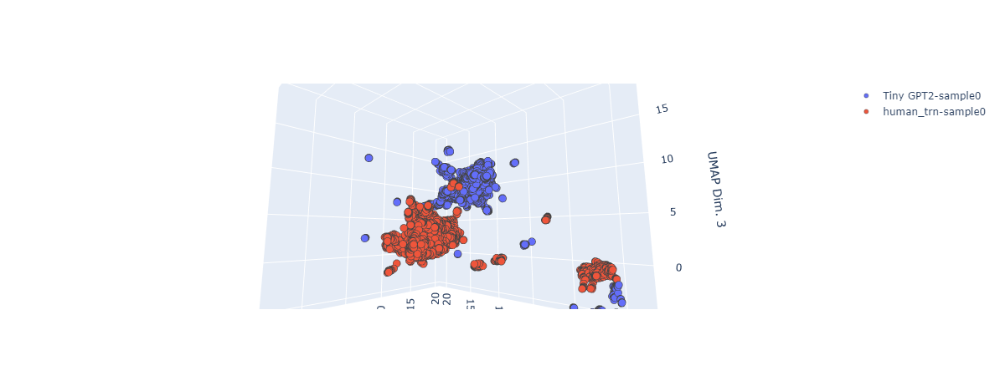

Plotting decision boundaries


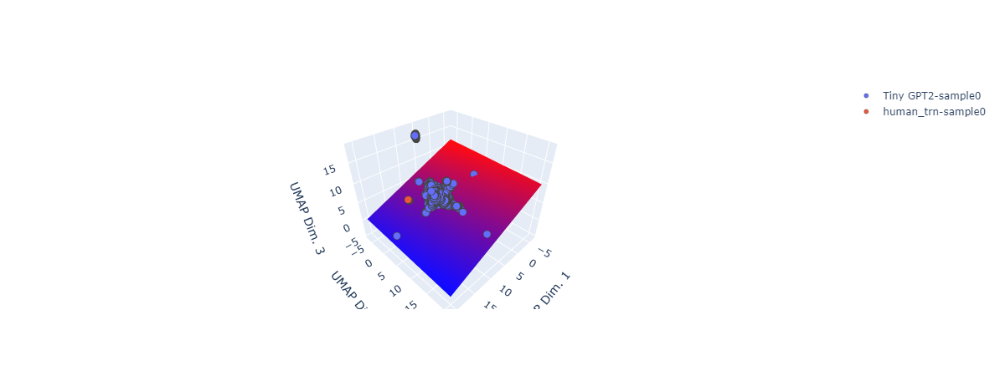

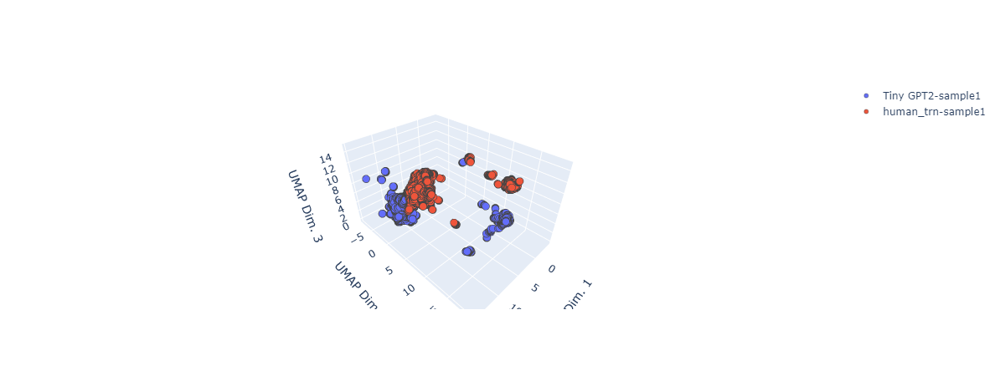

Plotting decision boundaries


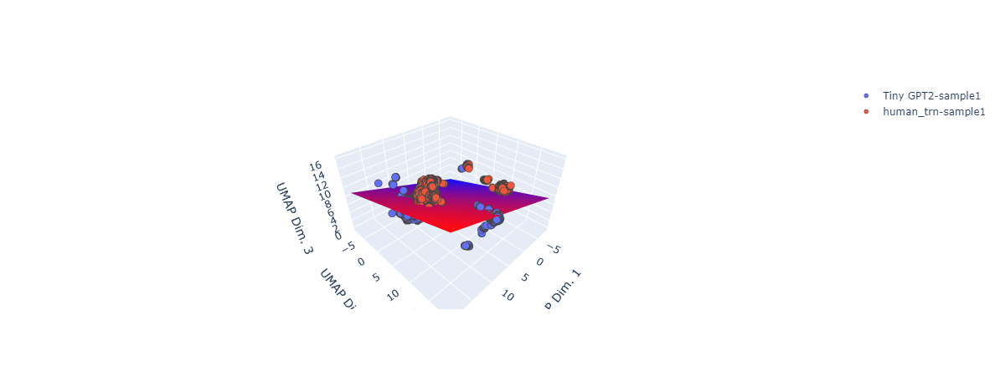

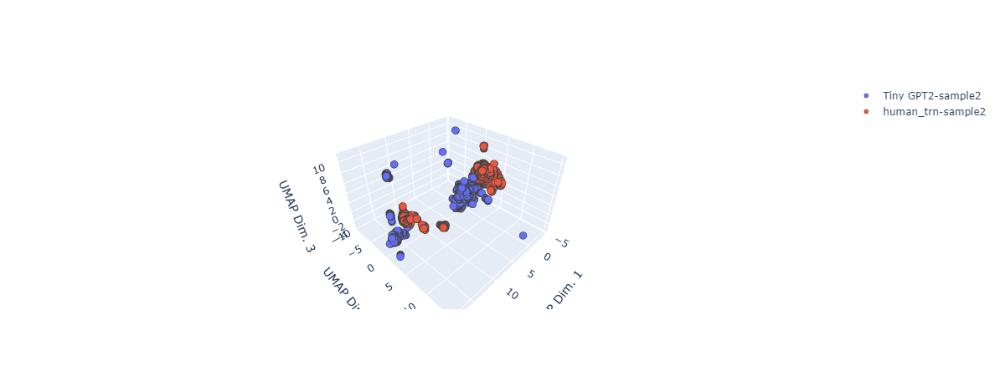

Plotting decision boundaries


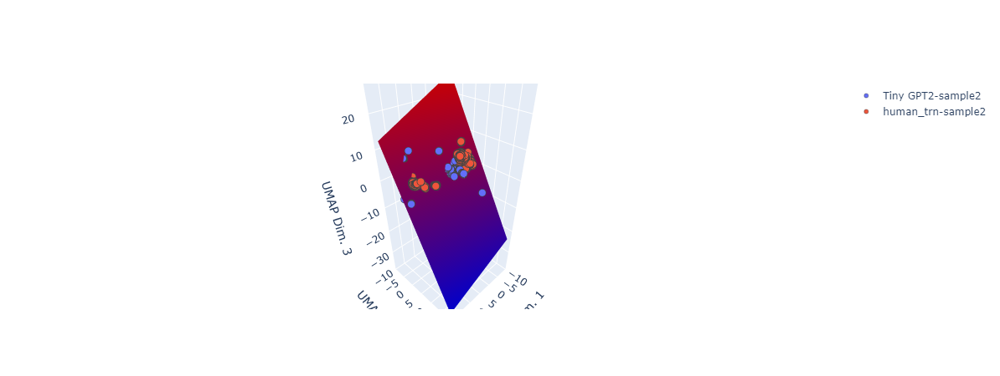

In [109]:
plot_3d_data(
    model_config="tfr_layers6_vocab10000_embd768_heads12", model_name='Tiny GPT2',
    model_key='Tiny_GPT2', human_config="human_trn",
    human_key="Human_train",
    vectors_storage_path='/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/vectors',
    figures_export_path='.', n_experiments=3, 
    enable_visualization=True, export_figures=True,
    distance_metric='cosine'
)

In [36]:
a  = [1,2,3,4,5,6,7,8,9,10]

In [37]:
ixs = np.array(range(len(a)))

In [38]:
random_ixs = np.random.choice(ixs, size=4, replace=False)
random_ixs

array([5, 1, 8, 4])

In [39]:
np.take(a, random_ixs)

array([6, 2, 9, 5])

In [5]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [ ]:
# export

def test_proto_crits_results(model_config, human_config, model_key, vectors_storage_path,
                             model_name, n_experiments, data_path,
                             out_path,
                             enable_visualization=False,
                             export_figures=False,
                             gmm_color='rgb(86, 100, 175)'
                            ):
    gen_sample_files = get_vector_paths_4_sample_set(set_name=model_config, base_path=vectors_storage_path)
    human_sample_files = get_vector_paths_4_sample_set(set_name=human_config, base_path=vectors_storage_path)
    
    fig_info = []
    for i in tqdm(range(n_experiments)):
        gen_sample_set = str(gen_sample_files[i].parent).split("/")[-1]
        print(gen_sample_set)
        full_path = Path(data_path) / gen_sample_set / f"{model_key}-{human_config}"
        print(full_path)
        print(full_path.exists())
        # Load data for datapoints
        gen_feats_path = str(full_path / f"{model_name}-sample{i}-reduced-feats.npy")
        gen_feats = np.load(gen_feats_path)
        gen_prots_ids_path = str(full_path / f"{model_name}-sample{i}-idx.npy")
        gen_prots_ids = np.load(gen_prots_ids_path)
        
        gen_tuple = gen_feats, [], gen_prots_ids, []
        
        # Load data for distribution
        hmn_feats_path = str(full_path / f"{human_config}-sample{i}-reduced-feats.npy")
        hmn_feats = np.load(hmn_feats_path)
        hmn_prots_ids_path = str(full_path / f"{human_config}-sample{i}-idx.npy")
        hmn_prots_ids = np.load(hmn_prots_ids_path)
        
        human_tuple = hmn_feats, [], hmn_prots_ids, []
        
        gen_sample_set_name = f"{model_name}-sample{i}"
        hmn_sample_set_name = f"{human_config}-sample{i}"
        
        gmm_model_path = str(full_path / f"gmm-{human_config}-sample{i}-{model_name}-sample{i}")
        
#         print(hmn_feats_path)
#         print(Path(hmn_feats_path).exists())
        
        
#         print(hmn_feats)
        
        
#         print(hmn_prots_path)
#         print(Path(hmn_feats_path).exists())
        
        
        human_tuple = hmn_feats, [], hmn_prots_ids, []
        
#         print(hmn_prots)
        
        print(len(hmn_feats))
        print(len(hmn_prots_ids))
        
        add_labels = i == 0 or i == 15
        
        logging.info(f'Gathering comparison data for sample {i}...')
        traces_shapes = plot_gmms_vs_points(
            points_data=gen_tuple, 
            distribution_data=human_tuple,
            distribution_name=hmn_sample_set_name,
            points_name=gen_sample_set_name,
            out_path=out_path,
            show=False,
            export=export_figures,
            use_gmm_model=False,
            gmm_color=gmm_color,
            add_labels=add_labels,
            compute_crits=False
        )
        
        fig_info.append(traces_shapes)
            
    sheet_titles = tuple([f'Set {i+1}' for i in range(30)])
    plot_gmms_vs_points_sheet(sheet_titles, 30, fig_info, out_path,
                              'GPT2-vs-train', export=export_figures, show=enable_visualization)    

In [6]:
test_proto_crits_results(
    model_config="tfr_layers6_vocab10000_embd768_heads12",  human_config="human_trn",
    model_key='Tiny_GPT2', model_name="Tiny GPT2",
    vectors_storage_path="/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/vectors", n_experiments=30,
    data_path='/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/',
    out_path='test_data', gmm_color='rgb(86, 100, 175)', export_figures=True
)

  0%|          | 0/30 [00:00<?, ?it/s]

5000-samples_1631222818.64498
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631222818.64498/Tiny_GPT2-human_trn
True
5000
3


  3%|▎         | 1/30 [00:02<01:06,  2.30s/it]

5000-samples_1631222309.986657
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631222309.986657/Tiny_GPT2-human_trn
True
5000
3


  7%|▋         | 2/30 [00:04<00:59,  2.11s/it]

5000-samples_1631223337.287127
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631223337.287127/Tiny_GPT2-human_trn
True
5000
3


 10%|█         | 3/30 [00:06<00:55,  2.06s/it]

5000-samples_1631224113.850633
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631224113.850633/Tiny_GPT2-human_trn
True
5000
3


 13%|█▎        | 4/30 [00:08<00:52,  2.02s/it]

5000-samples_1631225144.336756
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631225144.336756/Tiny_GPT2-human_trn
True
5000
3


 17%|█▋        | 5/30 [00:10<00:51,  2.06s/it]

5000-samples_1631221514.63418
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631221514.63418/Tiny_GPT2-human_trn
True
5000
2


 20%|██        | 6/30 [00:12<00:48,  2.02s/it]

5000-samples_1631219469.689696
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631219469.689696/Tiny_GPT2-human_trn
True
5000
3


 23%|██▎       | 7/30 [00:14<00:47,  2.07s/it]

5000-samples_1631218179.551035
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631218179.551035/Tiny_GPT2-human_trn
True
5000
3


 27%|██▋       | 8/30 [00:16<00:45,  2.07s/it]

5000-samples_1631224374.066957
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631224374.066957/Tiny_GPT2-human_trn
True
5000
3


 30%|███       | 9/30 [00:18<00:43,  2.05s/it]

5000-samples_1631225403.948879
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631225403.948879/Tiny_GPT2-human_trn
True
5000
3


 33%|███▎      | 10/30 [00:20<00:41,  2.07s/it]

5000-samples_1631220236.831159
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631220236.831159/Tiny_GPT2-human_trn
True
5000
3


 37%|███▋      | 11/30 [00:22<00:38,  2.04s/it]

5000-samples_1631220485.496481
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631220485.496481/Tiny_GPT2-human_trn
True
5000
3


 40%|████      | 12/30 [00:24<00:36,  2.03s/it]

5000-samples_1631224884.464698
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631224884.464698/Tiny_GPT2-human_trn
True
5000
2


 43%|████▎     | 13/30 [00:26<00:34,  2.01s/it]

5000-samples_1631222051.483843
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631222051.483843/Tiny_GPT2-human_trn
True
5000
3


 47%|████▋     | 14/30 [00:28<00:31,  1.97s/it]

5000-samples_1631220735.918138
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631220735.918138/Tiny_GPT2-human_trn
True
5000
3


 50%|█████     | 15/30 [00:30<00:30,  2.01s/it]

5000-samples_1631223846.665304
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631223846.665304/Tiny_GPT2-human_trn
True
5000
3


 53%|█████▎    | 16/30 [00:32<00:27,  2.00s/it]

5000-samples_1631221255.740675
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631221255.740675/Tiny_GPT2-human_trn
True
5000
3


 57%|█████▋    | 17/30 [00:34<00:26,  2.03s/it]

5000-samples_1631219219.317912
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631219219.317912/Tiny_GPT2-human_trn
True
5000
3


 60%|██████    | 18/30 [00:36<00:24,  2.01s/it]

5000-samples_1631222559.268327
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631222559.268327/Tiny_GPT2-human_trn
True
5000
3


 63%|██████▎   | 19/30 [00:38<00:21,  2.00s/it]

5000-samples_1631223596.325939
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631223596.325939/Tiny_GPT2-human_trn
True
5000
2


 67%|██████▋   | 20/30 [00:40<00:19,  1.98s/it]

5000-samples_1631220996.218146
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631220996.218146/Tiny_GPT2-human_trn
True
5000
3


 70%|███████   | 21/30 [00:42<00:17,  1.98s/it]

5000-samples_1631219987.644109
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631219987.644109/Tiny_GPT2-human_trn
True
5000
3


 73%|███████▎  | 22/30 [00:44<00:15,  1.97s/it]

5000-samples_1631218700.265584
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631218700.265584/Tiny_GPT2-human_trn
True
5000
3


 77%|███████▋  | 23/30 [00:46<00:13,  2.00s/it]

5000-samples_1631221784.658488
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631221784.658488/Tiny_GPT2-human_trn
True
5000
2


 80%|████████  | 24/30 [00:48<00:12,  2.03s/it]

5000-samples_1631224634.666764
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631224634.666764/Tiny_GPT2-human_trn
True
5000
2


 83%|████████▎ | 25/30 [00:50<00:10,  2.04s/it]

5000-samples_1631225655.881853
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631225655.881853/Tiny_GPT2-human_trn
True
5000
2


 87%|████████▋ | 26/30 [00:52<00:08,  2.01s/it]

5000-samples_1631218959.642937
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631218959.642937/Tiny_GPT2-human_trn
True
5000
3


 90%|█████████ | 27/30 [00:54<00:06,  2.01s/it]

5000-samples_1625706218.156108
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1625706218.156108/Tiny_GPT2-human_trn
True
5000
3


 93%|█████████▎| 28/30 [00:56<00:03,  2.00s/it]

5000-samples_1631218441.167095
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631218441.167095/Tiny_GPT2-human_trn
True
5000
3


 97%|█████████▋| 29/30 [00:58<00:01,  1.98s/it]

5000-samples_1631223070.344206
/home/jovyan/work/notebooks/[interpretability]/uncondit_int_exp/results/images/tfr_layers6_vocab10000_embd768_heads12/5000-samples_1631223070.344206/Tiny_GPT2-human_trn
True
5000
3


100%|██████████| 30/30 [01:00<00:00,  2.02s/it]


In [12]:
# help(fig)

In [15]:
from nbdev.export import notebook2script
notebook2script()

Converted 0.1_mgmnt.prep.ipynb.
Converted 0.2_mgmnt.prep.files_mgmnt.ipynb.
Converted 0.3_mgmnt.prep.bpe_tokenization.ipynb.
Converted 0.4_mgmnt.prep.tokenization_counting.ipynb.
Converted 0.5_mgmnt.prep.token_mgmnt.ipynb.
Converted 1.1_exp.info.ipynb.
Converted 1.2_exp.desc.metrics.java.ipynb.
Converted 1.4_exp.metrics_python.ipynb.
Converted 1.5_exp.metrics_java.ipynb.
Converted 2.0_repr.codebert.ipynb.
Converted 2.0_repr.i.ipynb.
Converted 2.1_repr.codeberta.ipynb.
Converted 2.1_repr.roberta.train.ipynb.
Converted 2.2_repr.roberta.eval.ipynb.
Converted 2.3_repr.word2vec.train.ipynb.
Converted 2.6_repr.word2vec.eval.ipynb.
Converted 2.7_repr.distmetrics.ipynb.
Converted 2.8_repr.sentence_transformers.ipynb.
Converted 3.1_traceability.unsupervised.eda.ipynb.
Converted 3.2_traceability.unsupervised.approach.d2v.ipynb.
Converted 3.2_traceability.unsupervised.approach.w2v.ipynb.
Converted 4.0_infoxplainer.ir.ipynb.
Converted 4.1_infoxplainer.ir.unsupervised.d2v.ipynb.
Converted 4.2_infox